In [223]:
import os
from glob import glob
import pandas as pd 
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches
%matplotlib inline
from base64 import b64encode
from IPython.display import HTML
import cv2
import subprocess

In [224]:
data_dir = "nfl-player-contact-detection-2023\\"
train_dir = data_dir+"train"
test_dir = data_dir+"test"

In [225]:
train_labels = pd.read_csv(data_dir+"train_labels.csv")
train_labels.contact.unique()

array([0, 1], dtype=int64)

In [226]:
train_labels

,contact_id,game_play,datetime,step,nfl_player_id_1,nfl_player_id_2,contact
0,58168_003392_0_38590_43854,58168_003392,2020-09-11T03:01:48.100Z,0,38590,43854,0
1,58168_003392_0_38590_41257,58168_003392,2020-09-11T03:01:48.100Z,0,38590,41257,0
2,58168_003392_0_38590_41944,58168_003392,2020-09-11T03:01:48.100Z,0,38590,41944,0
3,58168_003392_0_38590_42386,58168_003392,2020-09-11T03:01:48.100Z,0,38590,42386,0
4,58168_003392_0_38590_47944,58168_003392,2020-09-11T03:01:48.100Z,0,38590,47944,0
...,...,...,...,...,...,...,...
4721613,58582_003121_91_48220_G,58582_003121,2021-10-12T02:42:29.100Z,91,48220,G,0
4721614,58582_003121_91_47906_G,58582_003121,2021-10-12T02:42:29.100Z,91,47906,G,0
4721615,58582_003121_91_38557_G,58582_003121,2021-10-12T02:42:29.100Z,91,38557,G,0
4721616,58582_003121_91_47872_G,58582_003121,2021-10-12T02:42:29.100Z,91,47872,G,0


In [227]:
train_baseline_helmets = pd.read_csv(data_dir+"train_baseline_helmets.csv")
train_baseline_helmets

,game_play,game_key,play_id,view,video,frame,nfl_player_id,player_label,left,width,top,height
0,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,39947,H72,946,25,293,34
1,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,37211,H42,151,25,267,33
2,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,38590,H70,810,25,293,35
3,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,44822,H15,681,26,254,33
4,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,290,41944,V92,680,23,303,33
...,...,...,...,...,...,...,...,...,...,...,...,...
3783611,58582_003121,58582,3121,Sideline,58582_003121_Sideline.mp4,842,52500,H13,497,24,316,25
3783612,58582_003121,58582,3121,Sideline,58582_003121_Sideline.mp4,842,52493,V32,914,23,356,26
3783613,58582_003121,58582,3121,Sideline,58582_003121_Sideline.mp4,842,45009,V97,30,29,446,23
3783614,58582_003121,58582,3121,Sideline,58582_003121_Sideline.mp4,842,46155,H89,750,18,338,26


In [228]:
train_player_tracking = pd.read_csv(data_dir+"train_player_tracking.csv")
train_player_tracking

,game_play,game_key,play_id,nfl_player_id,datetime,step,team,position,jersey_number,x_position,y_position,speed,distance,direction,orientation,acceleration,sa
0,58580_001136,58580,1136,44830,2021-10-10T21:08:20.900Z,-108,away,CB,22,61.59,42.60,1.11,0.11,320.33,263.93,0.71,-0.64
1,58580_001136,58580,1136,47800,2021-10-10T21:08:20.900Z,-108,away,DE,97,59.48,26.81,0.23,0.01,346.84,247.16,1.29,0.90
2,58580_001136,58580,1136,52444,2021-10-10T21:08:20.900Z,-108,away,FS,29,72.19,31.46,0.61,0.06,11.77,247.69,0.63,-0.33
3,58580_001136,58580,1136,46206,2021-10-10T21:08:20.900Z,-108,home,TE,86,57.37,22.12,0.37,0.04,127.85,63.63,0.69,0.62
4,58580_001136,58580,1136,52663,2021-10-10T21:08:20.900Z,-108,away,ILB,48,63.25,27.50,0.51,0.05,183.62,253.71,0.31,0.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1353048,58575_003081,58575,3081,48476,2021-10-10T19:22:06.800Z,140,away,CB,40,72.28,51.80,1.59,0.17,345.36,342.68,0.49,-0.41
1353049,58575_003081,58575,3081,44887,2021-10-10T19:22:06.800Z,140,away,ILB,45,74.76,54.50,0.98,0.10,342.39,354.46,0.63,-0.24
1353050,58575_003081,58575,3081,44174,2021-10-10T19:22:06.800Z,140,away,ILB,49,74.54,55.75,1.12,0.11,352.79,349.20,0.63,0.46
1353051,58575_003081,58575,3081,45217,2021-10-10T19:22:06.800Z,140,away,TE,82,80.44,48.77,1.93,0.20,340.78,346.51,0.53,-0.51


In [229]:
train_video_metadata = pd.read_csv(data_dir+"train_video_metadata.csv")
train_video_metadata["end_time"] = train_video_metadata.end_time.apply(pd.to_datetime)
train_video_metadata["start_time"] = train_video_metadata.start_time.apply(pd.to_datetime)
train_video_metadata["duration"] = (train_video_metadata["end_time"] - train_video_metadata["start_time"]).dt.total_seconds()
train_video_metadata

,game_play,game_key,play_id,view,start_time,end_time,snap_time,duration
0,58168_003392,58168,3392,Endzone,2020-09-11 03:01:43.134000+00:00,2020-09-11 03:01:54.971000+00:00,2020-09-11T03:01:48.134Z,11.837
1,58168_003392,58168,3392,Sideline,2020-09-11 03:01:43.134000+00:00,2020-09-11 03:01:54.971000+00:00,2020-09-11T03:01:48.134Z,11.837
2,58172_003247,58172,3247,Endzone,2020-09-13 19:30:42.414000+00:00,2020-09-13 19:31:00.524000+00:00,2020-09-13T19:30:47.414Z,18.110
3,58172_003247,58172,3247,Sideline,2020-09-13 19:30:42.414000+00:00,2020-09-13 19:31:00.524000+00:00,2020-09-13T19:30:47.414Z,18.110
4,58173_003606,58173,3606,Endzone,2020-09-13 19:45:07.527000+00:00,2020-09-13 19:45:26.438000+00:00,2020-09-13T19:45:12.527Z,18.911
...,...,...,...,...,...,...,...,...
475,58580_003294,58580,3294,Sideline,2021-10-10 22:49:20.085000+00:00,2021-10-10 22:49:33.891000+00:00,2021-10-10T22:49:25.085Z,13.806
476,58581_000040,58581,40,Endzone,2021-10-11 00:22:39.997000+00:00,2021-10-11 00:22:52.068000+00:00,2021-10-11T00:22:44.997Z,12.071
477,58581_000040,58581,40,Sideline,2021-10-11 00:22:39.997000+00:00,2021-10-11 00:22:52.068000+00:00,2021-10-11T00:22:44.997Z,12.071
478,58582_003121,58582,3121,Endzone,2021-10-12 02:42:15.078000+00:00,2021-10-12 02:42:29.118000+00:00,2021-10-12T02:42:20.078Z,14.040


In [230]:
paths = [train_labels, train_player_tracking]
df_keys = ['l', 'pt']
dfs = dict([(k, v) for k, v in zip(df_keys, paths)])
[(k, df.columns) for k, df in dfs.items()]

[('l',
  Index(['contact_id', 'game_play', 'datetime', 'step', 'nfl_player_id_1',
         'nfl_player_id_2', 'contact'],
        dtype='object')),
 ('pt',
  Index(['game_play', 'game_key', 'play_id', 'nfl_player_id', 'datetime', 'step',
         'team', 'position', 'jersey_number', 'x_position', 'y_position',
         'speed', 'distance', 'direction', 'orientation', 'acceleration', 'sa'],
        dtype='object'))]

In [232]:
#dfs

In [233]:
# Preprocessing
df = dfs['pt'][['game_play', 'nfl_player_id', 'step', 'team', 'x_position', 'y_position']]
df_colision1 = dfs['l'][['nfl_player_id_1', 'step', 'contact', 'game_play']].rename(columns={'nfl_player_id_1': 'nfl_player_id'}).drop_duplicates()
df_colision2 = dfs['l'][['nfl_player_id_2', 'step', 'contact', 'game_play']].rename(columns={'nfl_player_id_2': 'nfl_player_id'}).drop_duplicates()
df_colision2 = df_colision2[df_colision2['nfl_player_id'] != 'G']
df_colision2['nfl_player_id'] = df_colision2['nfl_player_id'].astype(int)
df_colision = pd.merge(df_colision1, df_colision2)
df_final = pd.merge(df, df_colision, on=['nfl_player_id', 'step', 'game_play'])
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 399740 entries, 0 to 399739
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   game_play      399740 non-null  object 
 1   nfl_player_id  399740 non-null  int64  
 2   step           399740 non-null  int64  
 3   team           399740 non-null  object 
 4   x_position     399740 non-null  float64
 5   y_position     399740 non-null  float64
 6   contact        399740 non-null  int64  
dtypes: float64(2), int64(3), object(2)
memory usage: 24.4+ MB


In [234]:
df_final

,game_play,nfl_player_id,step,team,x_position,y_position,contact
0,58580_001136,41242,0,home,57.43,25.01,0
1,58580_001136,43330,0,away,59.63,32.99,0
2,58580_001136,52444,0,away,74.72,30.17,0
3,58580_001136,52938,0,home,57.20,23.70,0
4,58580_001136,43351,0,away,65.18,10.65,0
...,...,...,...,...,...,...,...
399735,58575_003081,46915,72,home,102.76,44.41,0
399736,58575_003081,44174,72,away,75.61,45.82,0
399737,58575_003081,46192,72,away,101.22,40.88,0
399738,58575_003081,44887,72,away,79.44,46.89,0


In [235]:
train_video_metadata.game_play.nunique()

240

In [236]:
train_video_metadata.view.value_counts()

Endzone     240
Sideline    240
Name: view, dtype: int64

In [237]:
train_video_metadata.play_id.value_counts()

1078    4
3176    4
452     4
2516    4
3091    4
       ..
120     2
1429    2
4520    2
2768    2
3121    2
Name: play_id, Length: 233, dtype: int64

In [238]:
px.histogram(train_video_metadata, x='view', color='view')

In [239]:
fig = px.box(x=train_video_metadata["duration"],
             template="simple_white",
             title= "Distribution of Play Duration",
             labels={'x': 'Time (in sec.)'},
             color_discrete_sequence=px.colors.sequential.Burg_r)

fig.update_layout(coloraxis_showscale=False)
fig.show()

In [240]:
train_video_gen = glob(train_dir+'//*.mp4', recursive = True)
len(train_video_gen)

720

In [274]:
def play(filename: str):
    video = open(filename,'rb').read()
    src = f'data:video/mp4;base64,{b64encode(video).decode()}'
    html = f'<video width=500 controls autoplay loop><source src="{src}" type="video/mp4"></video>'

    return HTML(html)
#play(train_video_gen[0])

In [242]:
def create_football_field(
    linenumbers=True,
    endzones=True,
    figsize=(12, 6.33),
    line_color="black",
    field_color="white",
    ez_color=None,
    ax=None,
    return_fig=False,
):
    """
    Function that plots the football field for viewing plays.
    Allows for showing or hiding endzones.
    """

    if ez_color is None:
        ez_color = field_color

    rect = patches.Rectangle(
        (0, 0),
        120,
        53.3,
        linewidth=0.1,
        edgecolor="r",
        facecolor=field_color,
        zorder=0,
    )

    if ax is None:
        fig, ax = plt.subplots(1, figsize=figsize)
    ax.add_patch(rect)
    ax.plot([10, 10, 10, 20, 20, 30, 30, 40, 40, 50, 50, 60, 60, 70, 70, 80,
              80, 90, 90, 100, 100, 110, 110, 120, 0, 0, 120, 120],
             [0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3,
              53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 53.3, 0, 0, 53.3],
             color=line_color)
    
    # Endzones
    if endzones:
        ez1 = patches.Rectangle(
            (0, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor=line_color,
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ez2 = patches.Rectangle(
            (110, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor=line_color,
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ax.add_patch(ez1)
        ax.add_patch(ez2)

    ax.axis("off")
    if linenumbers:
        for x in range(20, 110, 10):
            numb = x
            if x > 50:
                numb = 120 - x
            ax.text(
                x,
                5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color=line_color,
            )
            ax.text(
                x - 0.95,
                53.3 - 5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color=line_color,
                rotation=180,
            )
    if endzones:
        hash_range = range(11, 110)
    else:
        hash_range = range(1, 120)

    for x in hash_range:
        ax.plot([x, x], [0.4, 0.7], color=line_color)
        ax.plot([x, x], [53.0, 52.5], color=line_color)
        ax.plot([x, x], [22.91, 23.57], color=line_color)
        ax.plot([x, x], [29.73, 30.39], color=line_color)

    border = patches.Rectangle(
        (-5, -5),
        120 + 10,
        53.3 + 10,
        linewidth=0.1,
        edgecolor="orange",
        facecolor=line_color,
        alpha=0,
        zorder=0,
    )
    ax.add_patch(border)
    ax.set_xlim((-5, 125))
    ax.set_ylim((-5, 53.3 + 5))

    if return_fig:
        return fig, ax
    else:
        return ax

<AxesSubplot: >

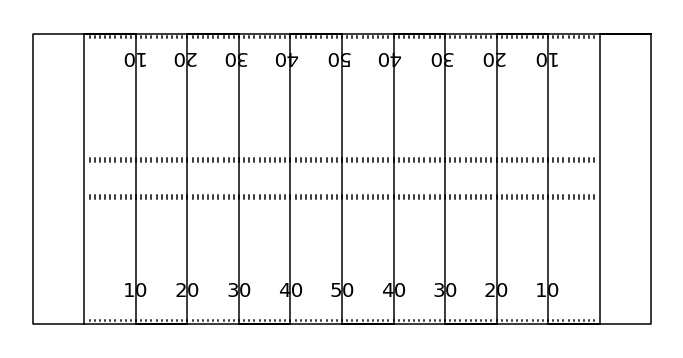

In [243]:
create_football_field()

In [244]:
def scatter_animation(game_play):
    steps = df_final.query("game_play == @game_play").step
    frames = sorted(steps[steps >= 0].unique())
    min_step = min(frames)

    example_tracks = df_final.query("game_play == @game_play and step == @min_step")
    fig, ax = create_football_field(return_fig=True)

    scat = ax.scatter(
        example_tracks["x_position"],
        example_tracks["y_position"],
        color=example_tracks["team"].replace({'home': 'deepskyblue', 'away': 'limegreen'}),
        s=65,
        lw=2,
        edgecolors=example_tracks["contact"].replace({0: 'black', 1:'red'}),
        zorder=5,)
    ax.set_title(f"Tracking data for {game_play}: at step {min_step}", fontsize=15)

    def animate(i):
        example_tracks = df_final.query("game_play == @game_play and step == @i")
        scat.set_offsets(example_tracks[["x_position","y_position"]].to_numpy())
        # Blue for home and Green for away
        scat.set_color(example_tracks["team"].replace({'home': 'deepskyblue', 'away': 'limegreen'}))
        # Red edgecolor for contact
        scat.set_edgecolor(example_tracks["contact"].replace({0: 'black', 1:'red'}))
        scat.set_linewidth(2)
        ax.set_title(f"Tracking data for {game_play}: at step {i}", fontsize=16, fontweight='bold')
    
    Writer = animation.writers['ffmpeg']
    writer = Writer(fps=20, metadata=dict(artist='Me'), bitrate=1800)
    
    return animation.FuncAnimation(fig, animate, frames=frames,interval=75)

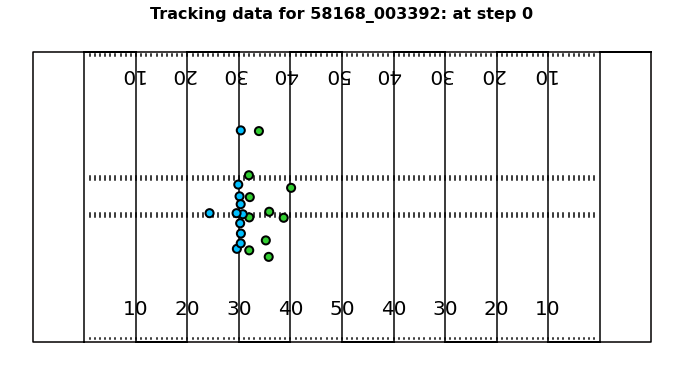

In [245]:
game_play = "58168_003392"
anim = scatter_animation(game_play)

In [247]:
sample_video = "58168_003392_Endzone.mp4"
SAMPLE = os.path.join(data_dir, "train/"+sample_video)
print(SAMPLE)

nfl-player-contact-detection-2023\train/58168_003392_Endzone.mp4


In [248]:
def play_video(filename: str):
    video = open(filename,'rb').read()
    src = f'data:video/mp4;base64,{b64encode(video).decode()}'
    html = f'<video width=500 controls autoplay loop><source src="{src}" type="video/mp4"></video>'

    return HTML(html)

# Calculate the file size in KB, MB, GB
def convert_bytes(size):
    """ Convert bytes to KB, or MB or GB"""
    for x in ['bytes', 'KB', 'MB', 'GB', 'TB']:
        if size < 1024.0:
            return "%3.1f %s" % (size, x)
        size /= 1024.0

In [271]:
#play_video(SAMPLE)

In [250]:
# Get metadata of the loaded video using cv2

cap = cv2.VideoCapture(SAMPLE)

frame_number = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print("Number of frames: ", frame_number)

fps = cap.get(cv2.CAP_PROP_FPS)
print('Frames per second: ', fps)

video_length_second = frame_number / fps
print('Video lenth: ', video_length_second, 's')

Number of frames:  711
Frames per second:  59.94005994005994
Video lenth:  11.86185 s


In [267]:
def annotate_video_with_helmets(video_path: str, baseline_boxes:pd.DataFrame, verbose=True) -> str:
    """
    Annotates a video with baseline model boxes and labels.
    """
    video_name = video_path.split('/')[-1]
    play_name = video_name.split('.')[0]
    baseline_boxes = baseline_boxes.query("video==@video_name").copy()

    # Red for Contact
    
    # verbose
    if verbose==True:
        print(f"Running for {video_name}")
    
    # VideoCapture Object
    cap  = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    
    # VideoWriter Object
    output_path = "labeled_" + video_name
    tmp_output_path = "tmp_" + output_path
    out = cv2.VideoWriter(tmp_output_path, cv2.VideoWriter_fourcc(*'MP4V'), fps, (width, height))
    
    # check  if camera opened successfully
    if cap.isOpened() == False:
        print('Error opening file')
        
    # read until video is complete
    frame  = 1
    while(cap.isOpened()):
        # capture frame by frame
        ret, img = cap.read()
        
        if ret==True:
            # add play_name text
            cv2.putText(img, play_name,
                       (int(0.01*width), int(0.05*height)),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        int(1),
                        (0,0,0),
                        int(2)
                       )
            
            # add frame counter
            cv2.putText(img, "Frame: "+str(frame),
                       (int(0.80*width), int(0.05*height)),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        1,
                        (0,0,0),
                        2
                       )

            # adding helmet bounding boxes and player tags
            bbox_set = baseline_boxes.query("frame==@frame")
            for i, annot in enumerate(zip(np.array(bbox_set[['player_label','left','width','top','height']]))):
                if str(list(annot)[0][0][0])=='H':
                    HELMET_COLOR = (0,255,0) # Green for Home
                elif str(list(annot)[0][0][0])=='V':
                    HELMET_COLOR = (255,0,0) # Blue for Visitors
                    
                player_label, bbox_left, bbox_width, bbox_top, bbox_height = annot[0]
                # add helmet bbox
                cv2.rectangle(img, 
                              (bbox_left,bbox_top), (bbox_left+bbox_width, bbox_top+bbox_height),
                              HELMET_COLOR,
                              1
                             )
                # add player label
                cv2.putText(img, player_label,
                       (bbox_left+10, bbox_top+10),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        1,
                        HELMET_COLOR,
                        1
                       )
            
            frame += 1
            out.write(img) 
                
        # break the loop   
        else: 
            break
        
        
    out.release()
    
    # Not all browsers support the codec, we will re-load the file at tmp_output_path
    # and convert to a codec that is more broadly readable using ffmpeg
    if os.path.exists(output_path):
        os.remove(output_path)
    subprocess.run(
        [
            "ffmpeg",
            "-i",
            tmp_output_path,
            "-crf",
            "18",
            "-preset",
            "veryfast",
            "-hide_banner",
            "-loglevel",
            "error",
            "-vcodec",
            "libx264",
            output_path,
        ]
    )
    os.remove(tmp_output_path)
    
    return output_path

In [272]:
path = annotate_video_with_helmets(SAMPLE, train_baseline_helmets)
play_video(path)

Running for 58168_003392_Endzone.mp4


In [273]:
HTML(anim.to_html5_video())